<a href="https://colab.research.google.com/github/broistg/CV-Project-2_Nhom-18/blob/main/notebooks/CV_Project_2_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0.&nbsp; Hướng dẫn sử dụng

Notebook này minh họa kết quả thực nghiệm cho bài tập lớn số 2, bao gồm:

1. Hiện thực Gradient Domain Editing (Poisson Blending) để ghép ảnh tự nhiên

2. Minh họa và so sánh:
  * Scaling / Rotation / Shear / Mirror / Translation
  * Affine transformation
  * Projective (Homography) transformation

Hướng dẫn chạy: Nhấn nút `Run all` để chạy toàn bộ dự án.

# 1.&nbsp; Cài đặt thư viện và chuẩn bị dữ liệu

In [1]:
import os
import sys

import cv2
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)

In [2]:
GITHUB_USER = "broistg"
REPO_NAME = "CV-Project-2_Nhom-18"
REPO_URL = f"https://github.com/{GITHUB_USER}/{REPO_NAME}.git"
ROOT_DIR = "/content"
INPUT_DIR = "data/inputs"
OUTPUT_DIR = "data/outputs"

repo_absolute_path = os.path.join(ROOT_DIR, REPO_NAME)

# Clone Repository nếu chưa có
if not os.path.exists(repo_absolute_path):
    print(f"Cloning {REPO_NAME} from {REPO_URL}...")
    !git clone $REPO_URL
    print(f"Repository {REPO_NAME} cloned successfully into {repo_absolute_path}.")
else:
    print(f"Repository {REPO_NAME} already exists at {repo_absolute_path}.")

# Thiết lập thư mục làm việc
if os.path.abspath(os.getcwd()) != repo_absolute_path:
    os.chdir(repo_absolute_path)
    print(f"Changed current working directory to: {os.getcwd()}")
else:
    print(f"Current working directory is already: {os.getcwd()}")

# Thêm vào sys.path
if repo_absolute_path not in sys.path:
    sys.path.insert(0, repo_absolute_path)
    print(f"Added {repo_absolute_path} to sys.path.")
else:
    print(f"{repo_absolute_path} is already in sys.path.")

# Import module tự viết
try:
    from src import image_blending        # Xử lý Gradient Domain Editing (Part 1) và các phương pháp ghép ảnh trực tiếp
    from src import geometry_transform    # Xử lý biến đổi hình học (Part 2)
    from src import homography            # Xử lý biến đổi Projective và phần mở rộng
    from src import utils                 # Hàm hỗ trợ hiển thị và chuẩn hóa
    print("Custom modules (image_blending, geometry_trans, homography, utils) imported successfully from src.")
except ImportError as e:
    print(f"❌ Lỗi Import: {e}. Please ensure 'src' directory exists in {repo_absolute_path} and contains an __init__.py file for package recognition.")
    print("Current sys.path:", sys.path)

Cloning CV-Project-2_Nhom-18 from https://github.com/broistg/CV-Project-2_Nhom-18.git...
Cloning into 'CV-Project-2_Nhom-18'...
remote: Enumerating objects: 169, done.
remote: Counting objects: 100% (111/111), done.
remote: Compressing objects: 100% (98/98), done.
remote: Total 169 (delta 21), reused 87 (delta 12), pack-reused 58 (from 1)
Receiving objects: 100% (169/169), 79.23 MiB | 13.90 MiB/s, done.
Resolving deltas: 100% (33/33), done.
Repository CV-Project-2_Nhom-18 cloned successfully into /content/CV-Project-2_Nhom-18.
Changed current working directory to: /content/CV-Project-2_Nhom-18
Added /content/CV-Project-2_Nhom-18 to sys.path.
Custom modules (image_blending, geometry_trans, homography, utils) imported successfully from src.


# 2.&nbsp; Gradient Domain Editing (Poisson Blending)

**Mục tiêu:** So sánh chất lượng đường biên và sự hòa hợp màu sắc (ánh sáng) giữa phương pháp cắt dán thông thường, Alpha Blending và Poisson Blending.

## 2.1&nbsp; Phương pháp tạo mask thủ công

Load ảnh source và background

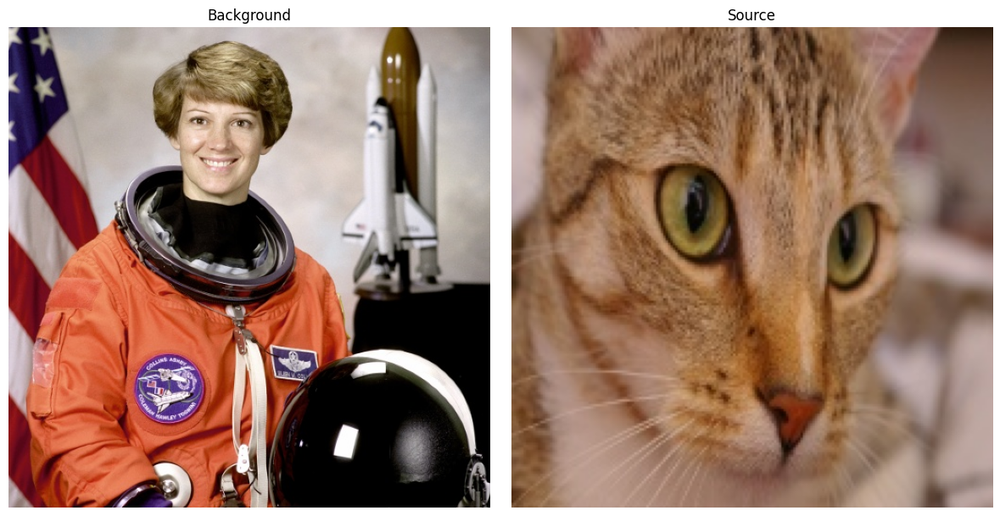

In [3]:
source_name = "src_cat.jpg"
source_path = os.path.join(INPUT_DIR, 'gde', source_name)
source = utils.read_image(source_path)

bg_name = "bg_astronaut.jpg"
bg_path = os.path.join(INPUT_DIR, 'gde', bg_name)
background = utils.read_image(bg_path)

utils.show_comparison(background, source, "Background", "Source")

Tạo mask thủ công hình elip

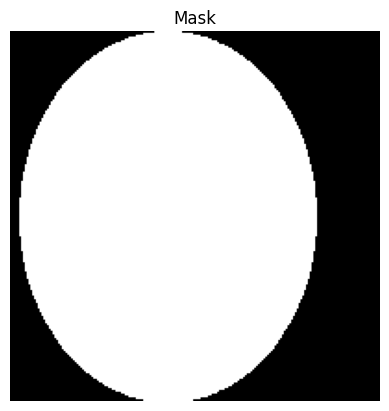

In [4]:
mask = np.zeros(source.shape[:2], dtype=np.uint8)
h, w = mask.shape
cv2.ellipse(mask, (w//2-15, h//2), (w//2-20, h//2), 0, 0, 360, 255, -1)

utils.show_image(mask, "Mask")

So sánh các phương pháp ghép ảnh

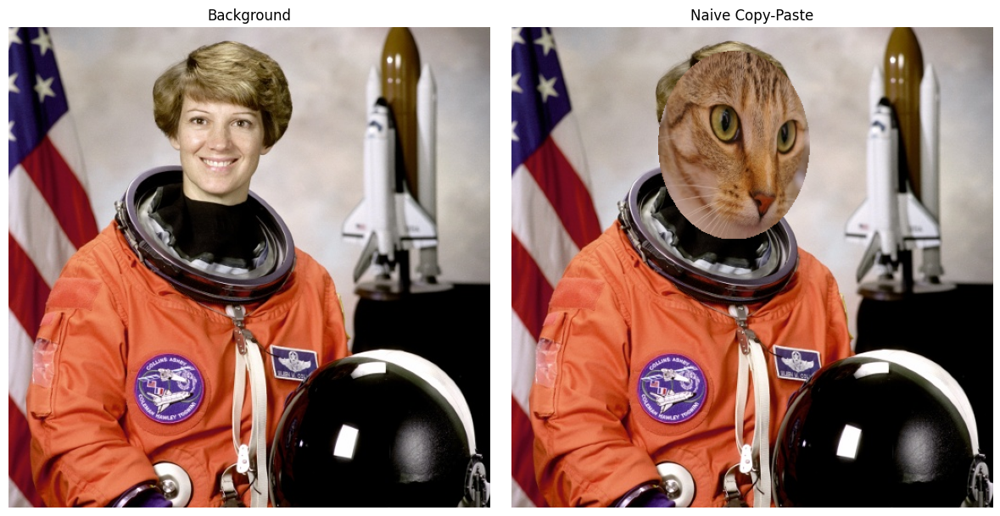

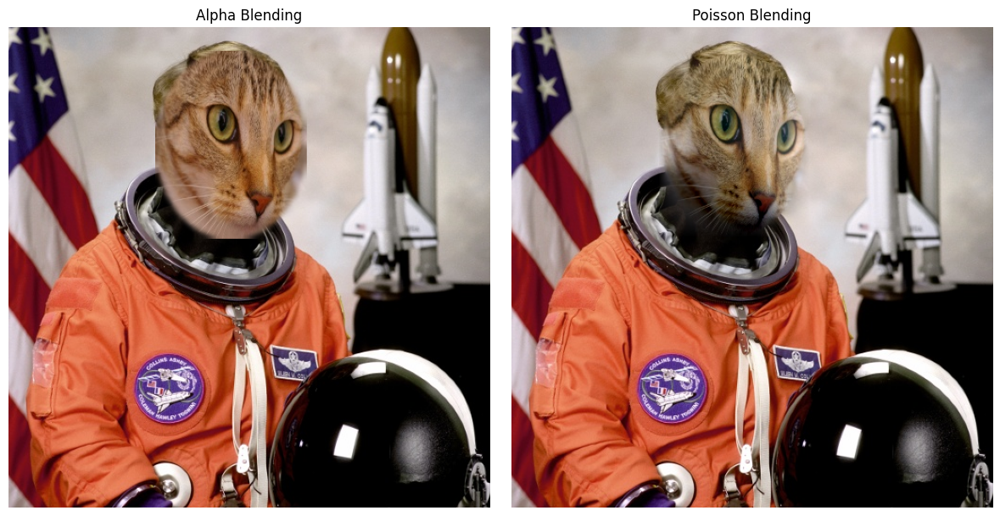

In [5]:
center = (background.shape[0] // 2 - 20, background.shape[1] // 2 - 130)
naive = image_blending.naive_copy_paste(source, background, mask, center)
alpha_blended = image_blending.alpha_blending(source, background, mask, center)
poisson_blended = image_blending.poisson_blending(source, background, mask, center)

utils.show_comparison(background, naive, "Background", "Naive Copy-Paste")
utils.show_comparison(alpha_blended, poisson_blended, "Alpha Blending", "Poisson Blending")

## 2.2&nbsp; Tạo mask bán tự động bằng GrabCut

Load ảnh source và background

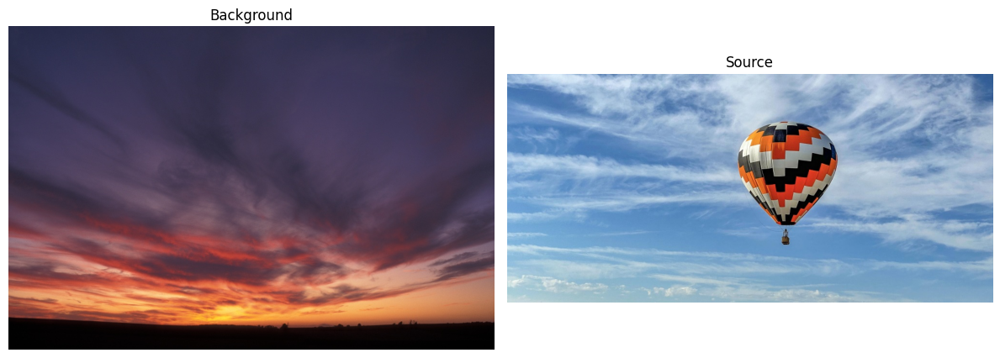

In [6]:
source_name = "src_balloon.jpg"
source_path = os.path.join(INPUT_DIR, 'gde', source_name)
source = utils.read_image(source_path)

bg_name = "bg_sunset.jpg"
bg_path = os.path.join(INPUT_DIR, 'gde', bg_name)
background = utils.read_image(bg_path)

utils.show_comparison(background, source, "Background", "Source")

Tạo mask GrabCut bằng cách xác định vùng cần giữ

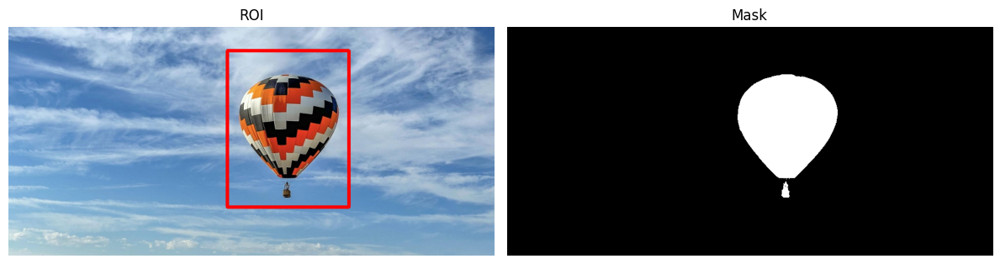

In [7]:
# Masking bằng GrabCut
mask = np.zeros(source.shape[:2], np.uint8)
bgModel = np.zeros((1,65), np.float64)
fgModel = np.zeros((1,65), np.float64)
start_point = (source.shape[1] // 2 - 50, 50)
end_point = (source.shape[1] // 2 + 200, source.shape[0] - 100)
rect = (start_point[0], start_point[1], end_point[0] - start_point[0], end_point[1] - start_point[1])
cv2.grabCut(source, mask, rect, bgModel, fgModel, 5, cv2.GC_INIT_WITH_RECT)
mask = np.where((mask==2)|(mask==0), 0, 255).astype('uint8')

# Hiện thị vùng quan tâm (Region of Interest)
roi = source.copy()
roi = cv2.rectangle(roi, start_point, end_point, 255, 5)

utils.show_comparison(roi, mask, "ROI", "Mask")

Mở rộng mask nhằm cải thiện gradient

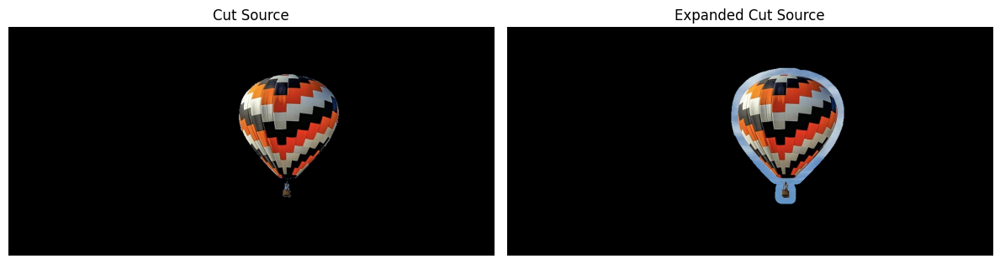

In [8]:
# Tạo kernel cho phép giản nỡ dilation
kernel = np.ones((7, 7), np.uint8)

# Áp dụng dilation lên mask
expanded_mask = cv2.dilate(mask, kernel, iterations=2)
expanded_mask = cv2.GaussianBlur(expanded_mask, (15, 15), 0)

# Hiển thị so sánh
cut_source = source.copy()
cut_source_expand = source.copy()
cut_source[mask == 0] = 0
cut_source_expand[expanded_mask == 0] = 0
utils.show_comparison(cut_source, cut_source_expand, "Cut Source", "Expanded Cut Source")

So sánh các phương pháp ghép ảnh

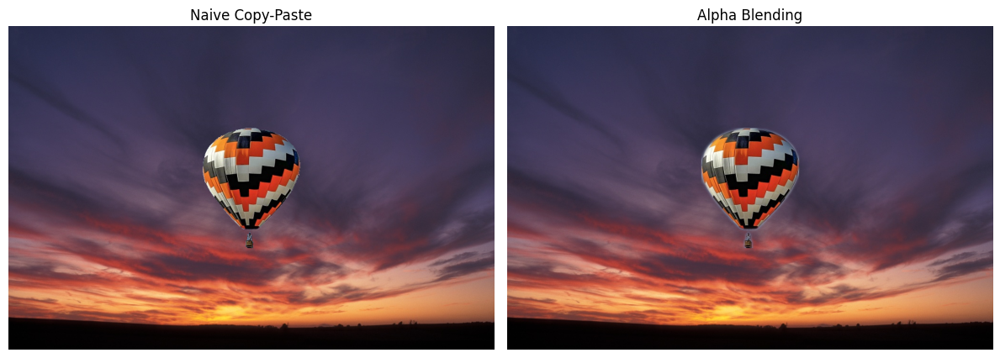

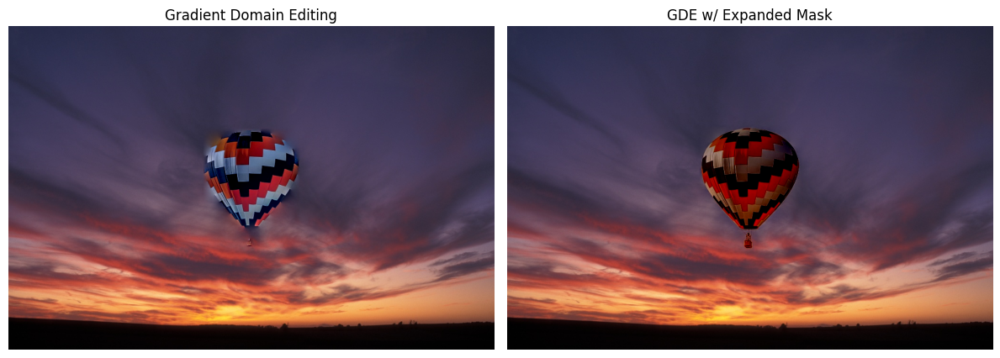

In [9]:
center = (background.shape[1] // 2, background.shape[0] // 2)
naive = image_blending.naive_copy_paste(source, background, mask, center)
alpha_blended = image_blending.alpha_blending(source, background, mask, center)
poisson_blended = image_blending.poisson_blending(source, background, mask, center)
poisson_blended_expanded = image_blending.poisson_blending(source, background, expanded_mask, center)

utils.show_comparison(naive, alpha_blended, "Naive Copy-Paste", "Alpha Blending")
utils.show_comparison(poisson_blended, poisson_blended_expanded, "Gradient Domain Editing", "GDE w/ Expanded Mask")

## 2.3&nbsp; Dán chữ lên bề mặt gồ ghề

Load ảnh source và background

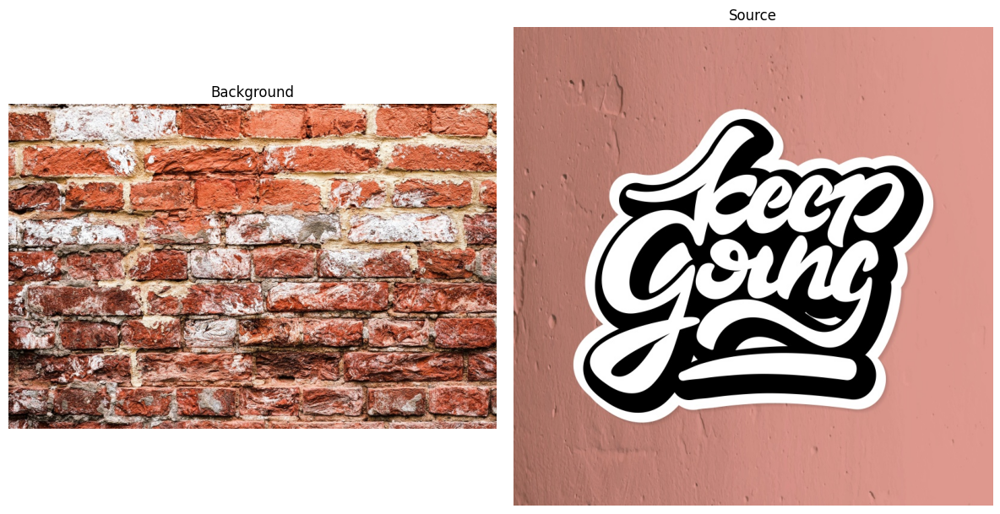

In [10]:
source_name = "src_graffiti.jpg"
source_path = os.path.join(INPUT_DIR, 'gde', source_name)
source = utils.read_image(source_path)

bg_name = "bg_brick.jpg"
bg_path = os.path.join(INPUT_DIR, 'gde', bg_name)
background = utils.read_image(bg_path)

utils.show_comparison(background, source, "Background", "Source")

Tạo mask GrabCut bằng cách xác định vùng cần giữ

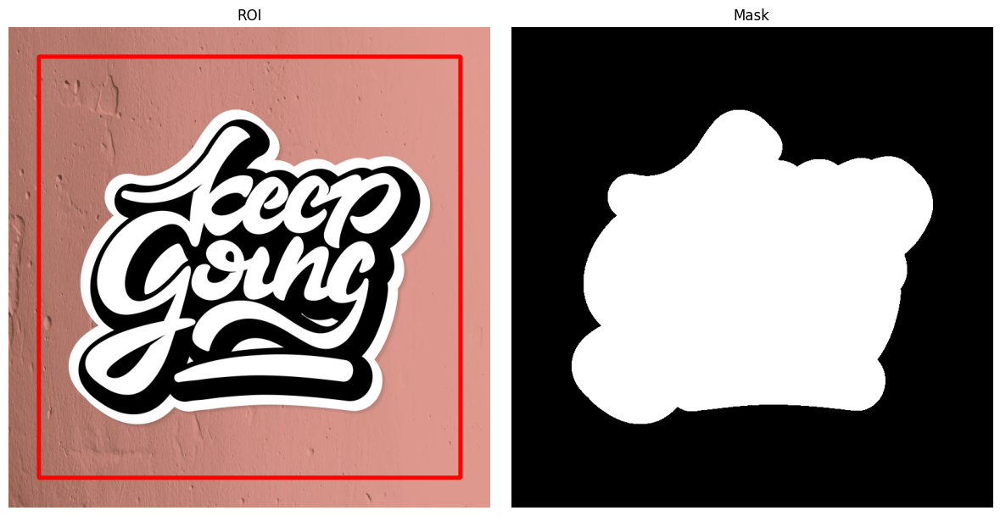

In [11]:
# Masking bằng GrabCut
mask = np.zeros(source.shape[:2], np.uint8)
bgModel = np.zeros((1,65), np.float64)
fgModel = np.zeros((1,65), np.float64)
start_point = (50, 50)
end_point = (source.shape[1] - 50, source.shape[0]- 50)
rect = (start_point[0], start_point[1], end_point[0] - start_point[0], end_point[1] - start_point[1])
cv2.grabCut(source, mask, rect, bgModel, fgModel, 5, cv2.GC_INIT_WITH_RECT)
mask = np.where((mask==2)|(mask==0), 0, 255).astype('uint8')

# Hiện thị vùng quan tâm (Region of Interest)
roi = source.copy()
roi = cv2.rectangle(roi, start_point, end_point, 255, 5)

utils.show_comparison(roi, mask, "ROI", "Mask")

Mở rộng mask nhằm cải thiện gradient

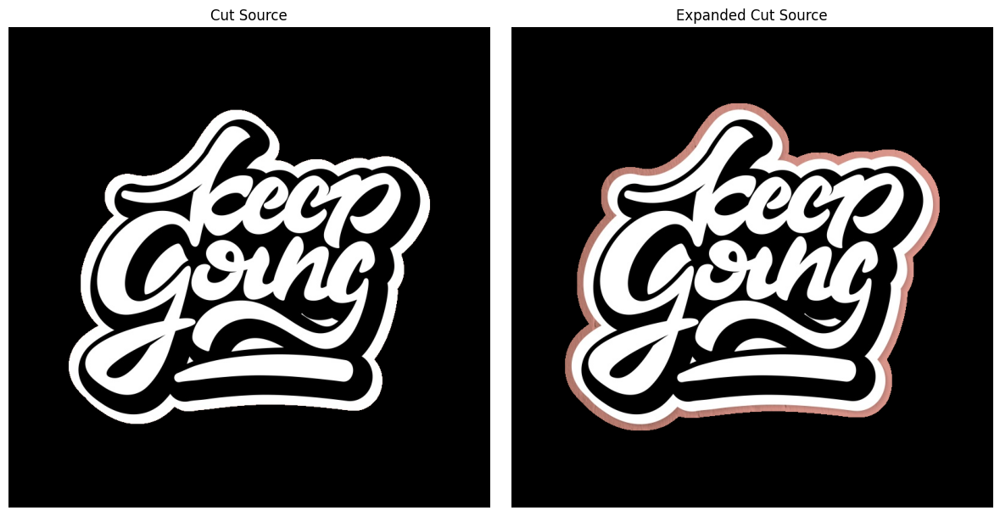

In [12]:
# Tạo kernel cho phép giản nỡ dilation
kernel = np.ones((5, 5), np.uint8)

# Áp dụng dilation lên mask
expanded_mask = cv2.dilate(mask, kernel, iterations=2)
expanded_mask = cv2.GaussianBlur(expanded_mask, (15, 15), 0)

# Hiển thị so sánh
cut_source = source.copy()
cut_source_expand = source.copy()
cut_source[mask == 0] = 0
cut_source_expand[expanded_mask == 0] = 0
utils.show_comparison(cut_source, cut_source_expand, "Cut Source", "Expanded Cut Source")

So sánh các phương pháp ghép ảnh

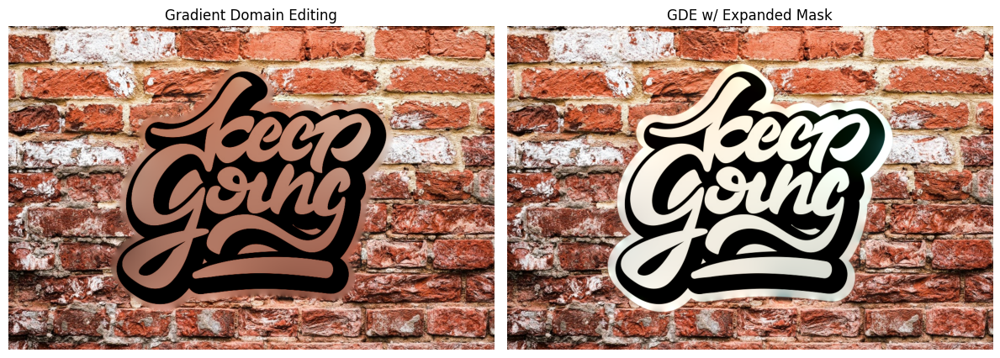

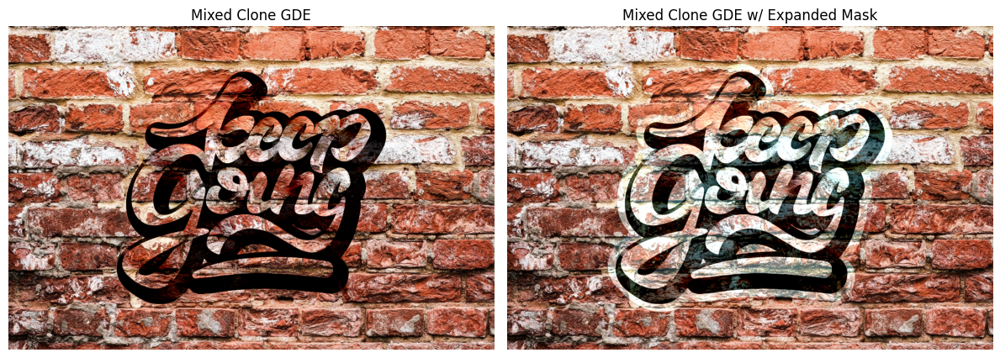

In [13]:
center = (background.shape[1] // 2, background.shape[0] // 2)
poisson_blended = image_blending.poisson_blending(source, background, mask, center)
poisson_blended_expanded = image_blending.poisson_blending(source, background, expanded_mask, center)
poisson_blended_mixed = image_blending.poisson_blending(source, background, mask, center, mode='mixed')
poisson_blended_mixed_expanded = image_blending.poisson_blending(source, background, expanded_mask, center, mode='mixed')

utils.show_comparison(poisson_blended, poisson_blended_expanded, "Gradient Domain Editing", "GDE w/ Expanded Mask")
utils.show_comparison(poisson_blended_mixed, poisson_blended_mixed_expanded, "Mixed Clone GDE", "Mixed Clone GDE w/ Expanded Mask")

# 3.&nbsp; Biến đổi hình học

**Mục tiêu:** Trực quan hóa kết quả của từng phép biến đổi hình học và So sánh giữa 2 phép Affine với Projective.

## 3.1&nbsp; Các phép biến đổi cơ bản





In [14]:
original_name = "building.jpg"
original_path = os.path.join(INPUT_DIR, 'geometry', original_name)
original = utils.read_image(original_path)
original = utils.resize_image_keep_aspect(original, max_width=1024)

### 3.1.1&nbsp; Phép co giãn (Scaling)





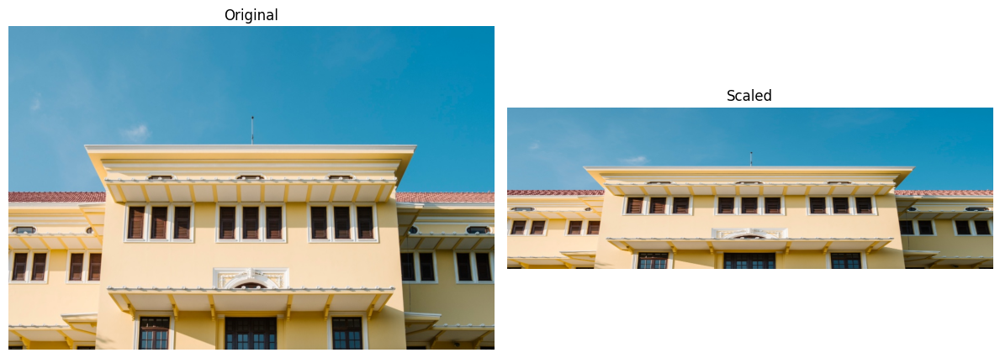

In [15]:
scaled = geometry_transform.scale_image(original, fx=1.0, fy=0.5)
utils.show_comparison(original, scaled, "Original", "Scaled")

### 3.1.2&nbsp; Phép xoay quay tâm ảnh (Rotation)





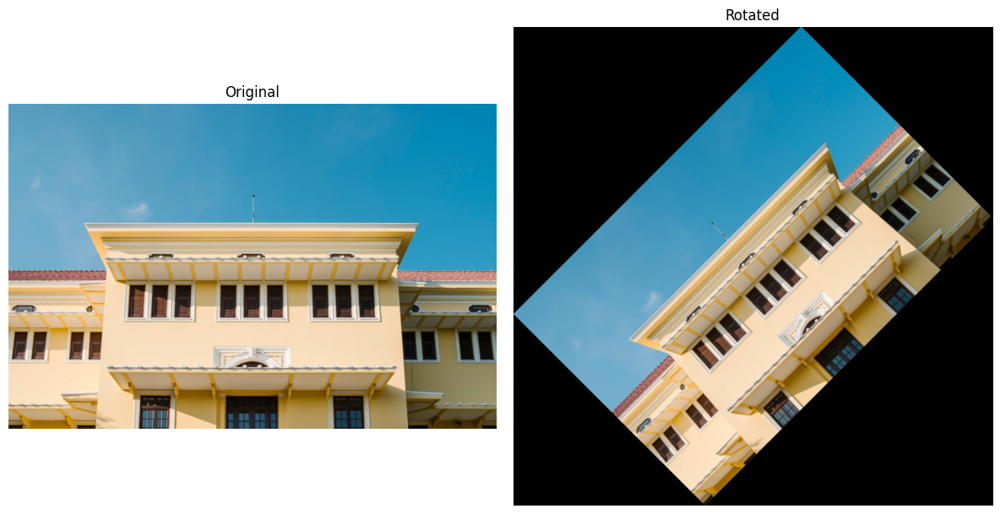

In [16]:
rotated = geometry_transform.rotate_image(original, angle=45)
utils.show_comparison(original, rotated, "Original", "Rotated")

### 3.1.3&nbsp; Phép trượt ảnh (Shear)





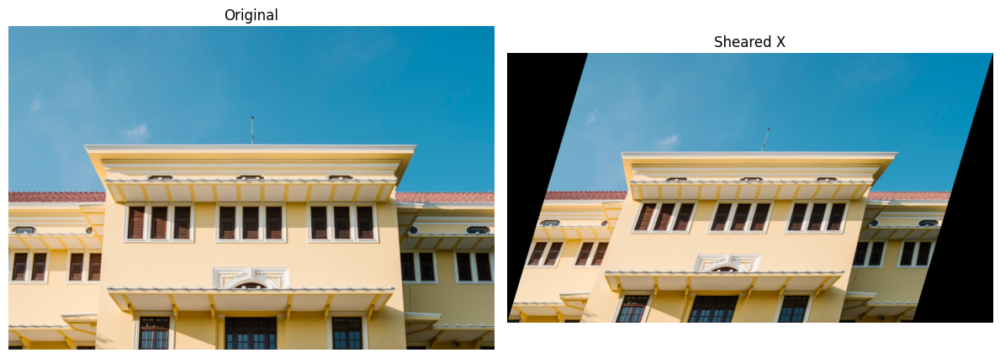

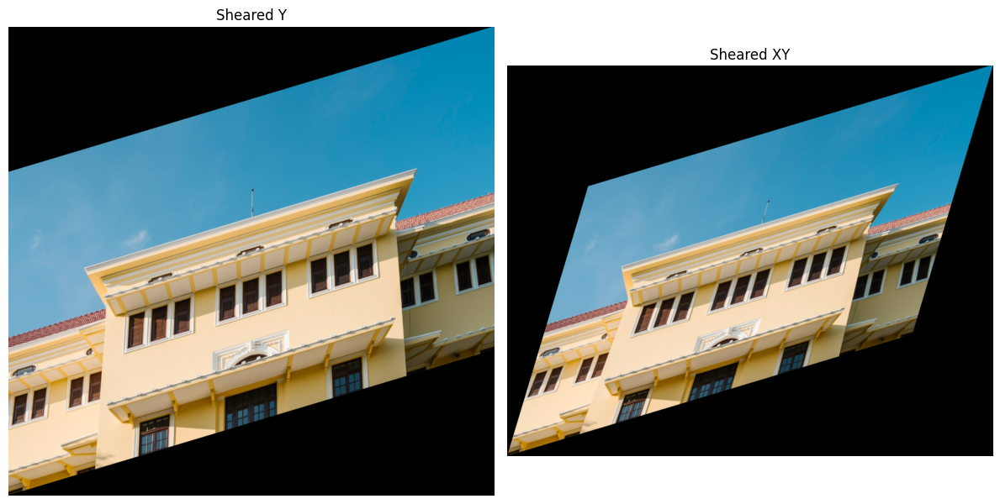

In [17]:
sheared_x = geometry_transform.shear_image(original, shear_x=0.3, shear_y=0)
sheared_y = geometry_transform.shear_image(original, shear_x=0, shear_y=0.3)
sheared_xy = geometry_transform.shear_image(original, shear_x=0.3, shear_y=0.3)
utils.show_comparison(original, sheared_x, "Original", "Sheared X")
utils.show_comparison(sheared_y, sheared_xy, "Sheared Y", "Sheared XY")

### 3.1.4&nbsp; Phép lật ảnh (Mirror)





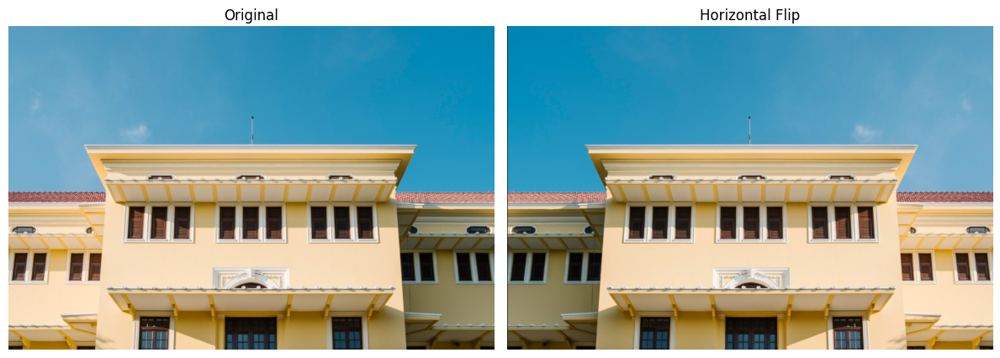

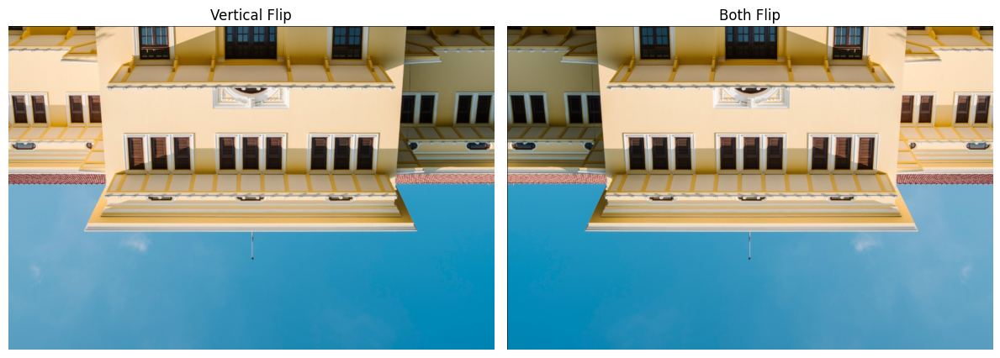

In [18]:
h_flipped = geometry_transform.mirror_image(original, direction='horizontal')
v_flipped = geometry_transform.mirror_image(original, direction='vertical')
both_flipped = geometry_transform.mirror_image(original, direction='both')
utils.show_comparison(original, h_flipped, "Original", "Horizontal Flip")
utils.show_comparison(v_flipped, both_flipped, "Vertical Flip", "Both Flip")

### 3.1.5&nbsp; Phép tịnh tiến (Translation)





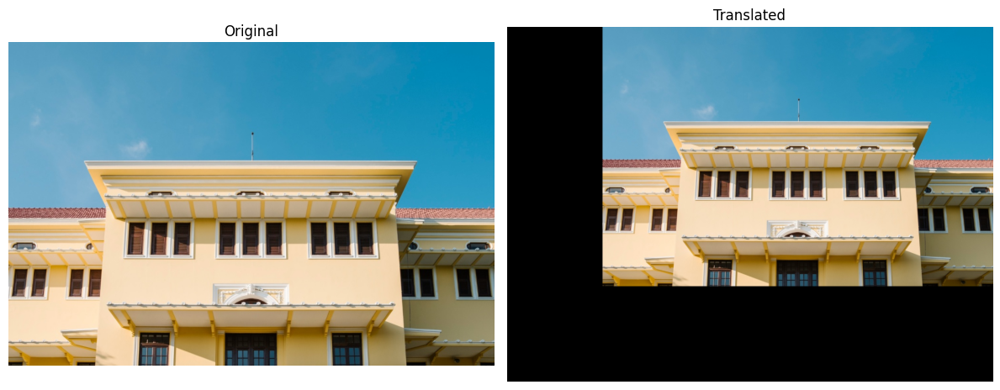

In [19]:
translated = geometry_transform.translate_image(original, tx=250, ty=250)
utils.show_comparison(original, translated, "Original", "Translated")

## 3.2&nbsp; So sánh giữa Affine và Projective

**Phân biệt được:** Affine giữ tính song song của các đường thẳng, trong khi Projective (Homography) có thể bóp méo phối cảnh (hiệu ứng gần to xa nhỏ).

Xác định các điểm gốc và điểm kết thúc của các phép biến đổi

In [20]:
# 4 điểm trên ảnh gốc tạo thành một hình chữ nhật
src_pts = np.float32([[400, 350], [600, 350], [600, 600], [400, 600]])

# Xác định 3 điểm của Affine
affine_src_3pts = src_pts[[0, 1, 3]]
affine_dst_3pts = np.float32([[450, 350], [650, 400], [350, 600]])

# Xác định 4 điểm của Projective
proj_dst_4pts = np.float32([[450, 400], [550, 400], [600, 600], [400, 600]])

Biến đổi Affine

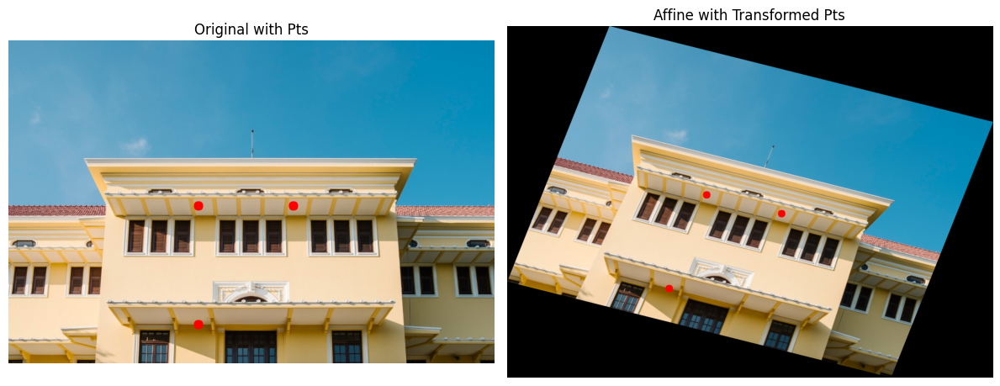

In [21]:
# Vẽ điểm trên ảnh gốc
original_with_pts = original.copy()
for pt in affine_src_3pts:
    cv2.circle(original_with_pts, np.int32(tuple(pt[:2])), 10, (255, 0, 0), -1)

# Biến đổi Affine
img_affine, M_safe = geometry_transform.affine_transform(original, affine_src_3pts, affine_dst_3pts, return_matrix=True)

# Dùng ma trận trả về biến đổi cho điểm
original_pts_transformed = np.float32([M_safe @ np.array([pt[0], pt[1], 1]) for pt in affine_src_3pts])

# Vẽ điểm trên ảnh Affine
img_affine_with_pts = img_affine.copy()
for pt in original_pts_transformed:
    cv2.circle(img_affine_with_pts, np.int32(tuple(pt[:2])), 10, (255, 0, 0), -1)

utils.show_comparison(original_with_pts, img_affine_with_pts, "Original with Pts", "Affine with Transformed Pts")

Biến đổi Projective

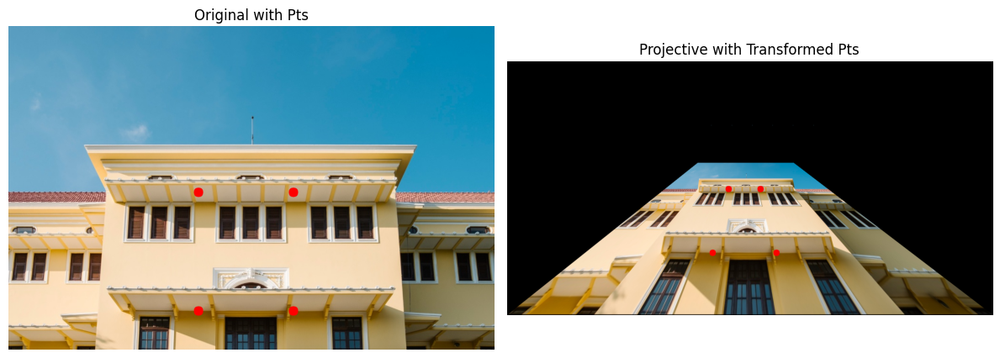

In [22]:
# Vẽ điểm trên ảnh gốc
original_with_pts = original.copy()
for pt in src_pts:
    cv2.circle(original_with_pts, np.int32(tuple(pt[:2])), 10, (255, 0, 0), -1)

# Biến đổi Projective
img_proj, H_safe = geometry_transform.projective_transform(original, src_pts, proj_dst_4pts, return_matrix=True)

# Dùng ma trận trả về biến đổi cho điểm
pts_original_3d = np.float32([src_pts])
original_pts_transformed = cv2.perspectiveTransform(pts_original_3d, H_safe)[0]
# original_pts_transformed = np.int32(original_pts_transformed).reshape((-1, 1, 2))

# Vẽ điểm trên ảnh Projective
img_proj_with_pts = img_proj.copy()
for pt in original_pts_transformed:
    cv2.circle(img_proj_with_pts, np.int32(tuple(pt[:2])), 10, (255, 0, 0), -1)

utils.show_comparison(original_with_pts, img_proj_with_pts, "Original with Pts", "Projective with Transformed Pts")

# 4.&nbsp; Thử nghiệm mở rộng

**Bài toán:** Dán ảnh người nổi tiếng lên mặt phẳng

**Mục tiêu:** Đánh giá độ chính xác khi dán ảnh. Phân tích khó khăn khi chọn điểm thủ công so với việc tự động tìm điểm tương đồng.

Ảnh người nổi tiếng

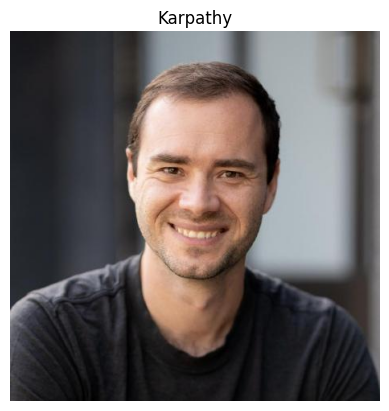

In [23]:
karpathy_name = "karpathy.jpeg"
karpathy_path = os.path.join(INPUT_DIR, 'geometry', karpathy_name)
karpathy = utils.read_image(karpathy_path)

utils.show_image(karpathy, "Karpathy")

Xác định điểm thủ công trên nền bảng quảng cáo

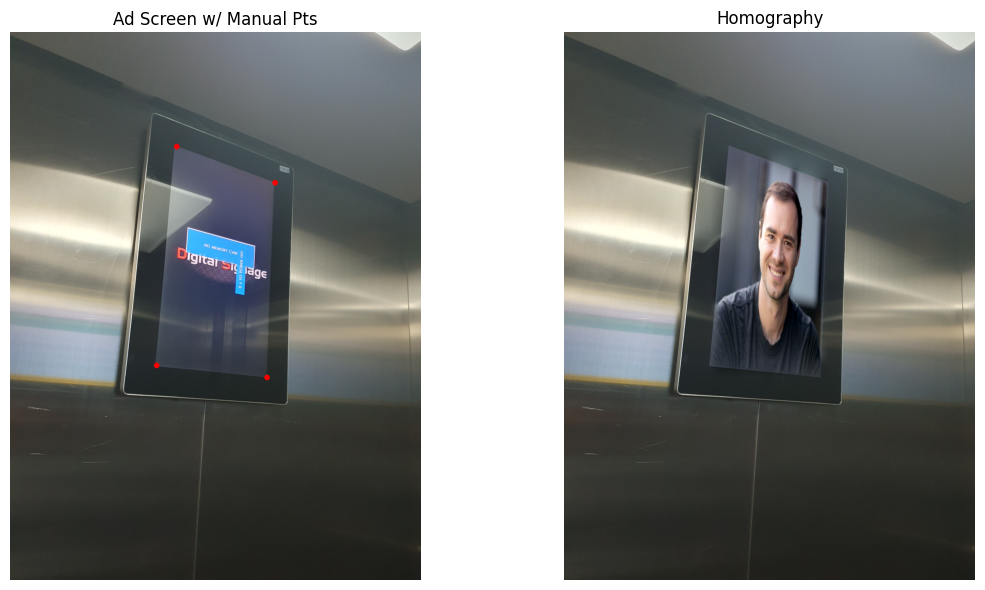

In [24]:
ad_screen_name = "bg1.jpg"
ad_screen_path = os.path.join(INPUT_DIR, 'geometry', ad_screen_name)
ad_screen = utils.read_image(ad_screen_path)
ad_screen = utils.resize_image_keep_aspect(ad_screen, max_width=1024)
ad_screen_dst_pts = np.float32([[415, 285], [660, 375], [640, 860], [365, 830]])

# Vẽ điểm trên ảnh gốc
ad_screen_with_pts = ad_screen.copy()
for pt in ad_screen_dst_pts:
    cv2.circle(ad_screen_with_pts, np.int32(tuple(pt[:2])), 7, (255, 0, 0), -1)

# Tính Homography
h_karpathy, w_karpathy = karpathy.shape[:2]
karpathy_src_pts = np.float32([[0, 0], [w_karpathy, 0], [w_karpathy, h_karpathy], [0, h_karpathy]])
H, _ = homography.get_homography(karpathy_src_pts, ad_screen_dst_pts)
homography_result = homography.overlay_image(ad_screen, karpathy, H, use_poisson=True)

utils.show_comparison(ad_screen_with_pts, homography_result, "Ad Screen w/ Manual Pts", "Homography")

Xác định điểm thủ công trên nền tòa nhà H6

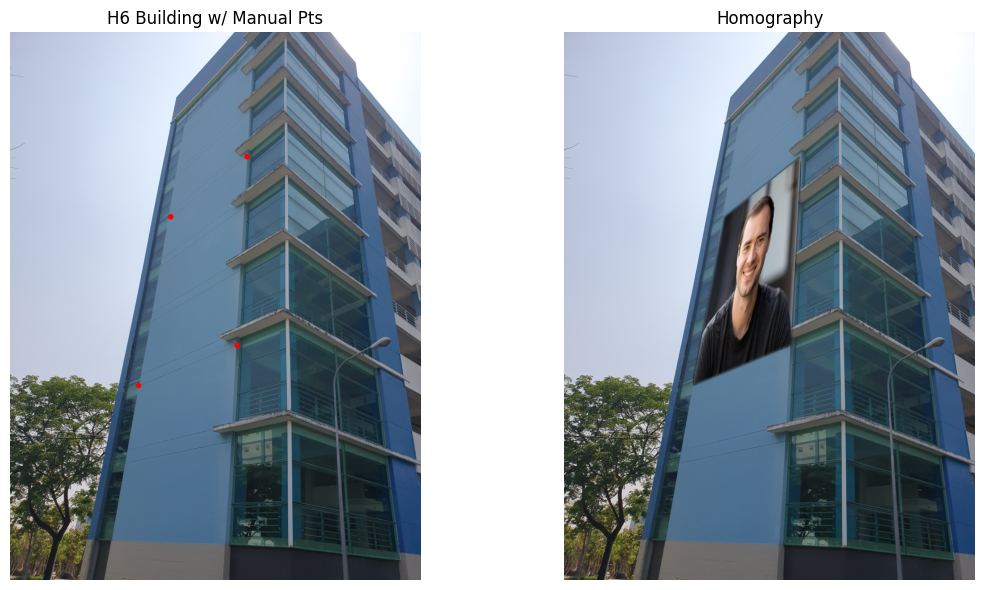

In [25]:
h6_building_name = "bg2.jpg"
h6_building_path = os.path.join(INPUT_DIR, 'geometry', h6_building_name)
h6_building = utils.read_image(h6_building_path)
h6_building = utils.resize_image_keep_aspect(h6_building, max_width=1024)
h6_building_dst_pts = np.float32([[400, 460], [590, 310], [565, 780], [320, 880]])

# Vẽ điểm trên ảnh gốc
h6_building_with_pts = h6_building.copy()
for pt in h6_building_dst_pts:
    cv2.circle(h6_building_with_pts, np.int32(tuple(pt[:2])), 7, (255, 0, 0), -1)

# Tính Homography
H, _ = homography.get_homography(karpathy_src_pts, h6_building_dst_pts)
homography_result = homography.overlay_image(h6_building, karpathy, H, use_poisson=False)

utils.show_comparison(h6_building_with_pts, homography_result, "H6 Building w/ Manual Pts", "Homography")

Xác định điểm tự động bằng ORB cần template nhưng vì ở dây không có nên ta giả lập bằng cách biến đổi Projective

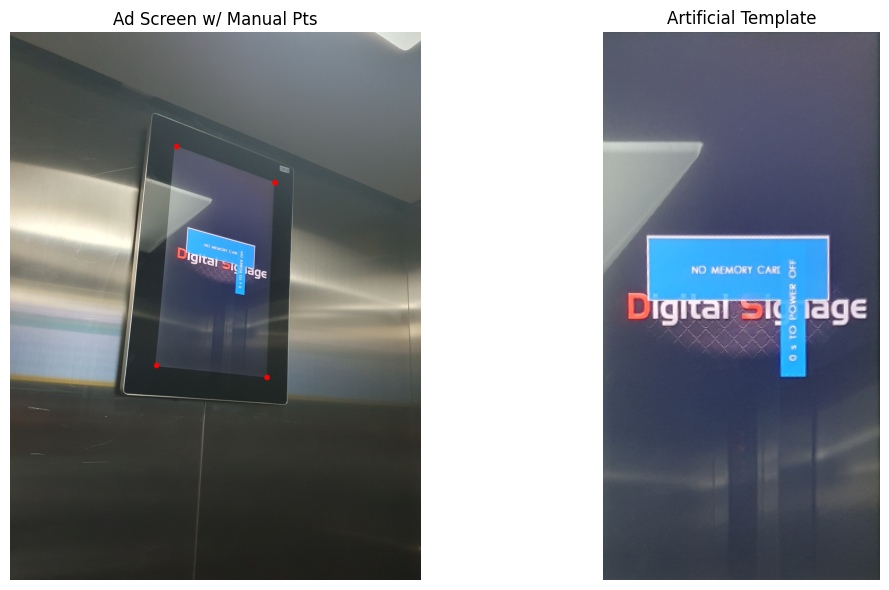

In [26]:
template_dst_pts = np.float32([[415, 375], [660, 375], [660, 860], [415, 860]])

# Biến đổi Projective
template, H_safe = geometry_transform.projective_transform(ad_screen, ad_screen_dst_pts, template_dst_pts, return_matrix=True)

# Dùng ma trận trả về biến đổi cho điểm
dst_pts_3d = np.float32([ad_screen_dst_pts])
dst_pts_transformed = cv2.perspectiveTransform(dst_pts_3d, H_safe)[0]

# Cắt ảnh theo điểm đã biến đổi
template = template[int(dst_pts_transformed[0][1]):int(dst_pts_transformed[2][1]),
                    int(dst_pts_transformed[0][0]):int(dst_pts_transformed[2][0])]

utils.show_comparison(ad_screen_with_pts, template, "Ad Screen w/ Manual Pts", "Artificial Template")

Xác định điểm tự động trên nền bảng quảng cáo

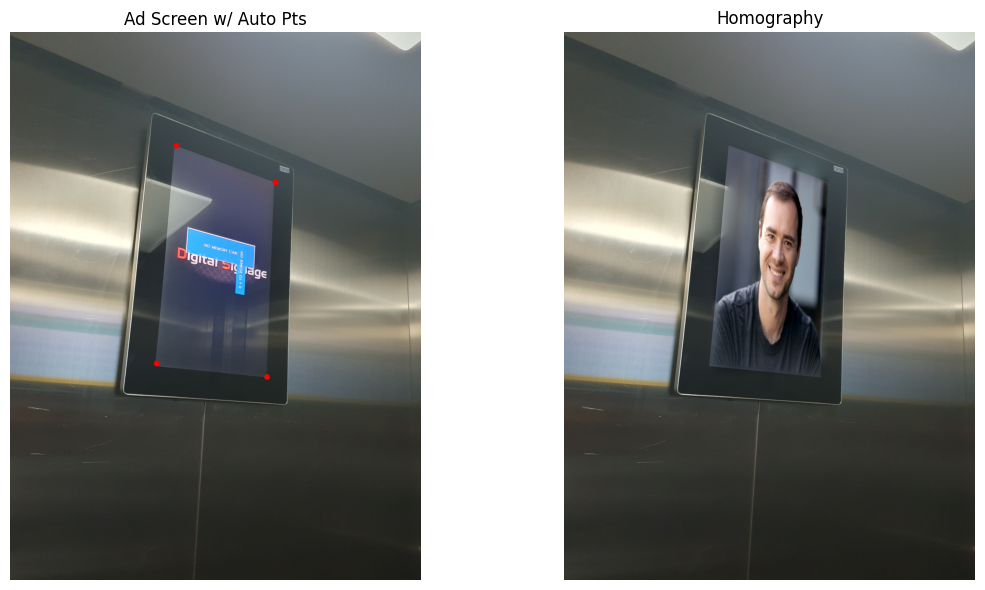

In [27]:
# Tìm điểm tự động bằng ORB
found_corners, H = homography.automatic_find_dst_pts(template, ad_screen)

# Vẽ điểm trên ảnh gốc
ad_screen_with_pts = ad_screen.copy()
for pt in found_corners:
    cv2.circle(ad_screen_with_pts, np.int32(tuple(pt[:2])), 7, (255, 0, 0), -1)

# Tính Homography
H, _ = homography.get_homography(karpathy_src_pts, found_corners)
homography_result = homography.overlay_image(ad_screen, karpathy, H, use_poisson=True)

utils.show_comparison(ad_screen_with_pts, homography_result, "Ad Screen w/ Auto Pts", "Homography")